In [84]:
import warnings
import numpy as np
import pandas as pd
import os
import re

import spectral
import pysptools
from spectral import *
from matplotlib import pyplot as plt
import numpy as np
from scipy import signal, interpolate, stats
from scipy.interpolate import interp1d
from scipy.signal import find_peaks, find_peaks_cwt
from scipy.integrate import trapezoid

# Suppress pandas warnings
warnings.filterwarnings('ignore')

# Settings
do_plots = False



In [587]:
# Functions

def extract_all_sheets(file_path):
    excel_file = pd.ExcelFile(file_path)
    sheet_names = excel_file.sheet_names
    
    all_data = [excel_file.parse(sheet_name, header = None) for sheet_name in sheet_names]
    
    return all_data

def get_spreadsheet_coords(df, label):
    """
    Accepts either a single label or a list
    """
    if type(label) is str:
        x_ind, y_ind = np.where(mineral_df == label)
        return x_ind[0], y_ind[0]

    elif type(label) is list:
        x_ind = []
        y_ind = []
        for list_val in label:
            x, y = np.where(df == list_val)
            x_ind.append(x[0])
            y_ind.append(y[0])
        return np.asarray(x_ind), np.asarray(y_ind)


def get_val_list(df,
                 val_name):
    # Identify how many features we have here
    start_x, start_y = get_spreadsheet_coords(df, val_name)
    val_list = []
    for i in range(start_x +1, df.shape[0]):
        curr_val = df.iloc[i , start_y]
        if i >= df.shape[0]:
            break
        elif not pd.isna(curr_val):
            val_list.append(curr_val)
        else:
            break
    
    print(f"Found {len(val_list)}: {val_list}")
    return val_list

def get_mask_from_waves(wav_array, wav_min, wav_max):
   return (wav_array >= wav_min) * (wav_array <= wav_max)

def generate_linear_regression(X, Y):
    # Convert from Series if necessary
    if type(X) != np.ndarray:
        X = np.asarray(X)
    if type(Y) != np.ndarray:
        Y = np.asarray(Y)    
    # Calculate the slope and intercept for the linear regression
    slope = (Y[-1] - Y[0]) / (X[-1] - X[0])
    intercept = Y[0] - slope * X[0]

    # Generate x values between the first and final points
    x_values = np.linspace(X[0], X[-1], num=len(X))

    # Generate y values using the linear regression equation
    y_values = slope * x_values + intercept

    return x_values, y_values

def parse_mineral_sheet(mineral_df):
    """
    """
    mineral_x, mineral_y = get_spreadsheet_coords(mineral_df, 'Mineral')
    
    # Identify which mineral we're parsing
    curr_mineral = mineral_df.iloc[mineral_x, mineral_y+1]
    print(f"Current mineral: {curr_mineral}")
    
    feature_list = get_val_list(mineral_df,
                                'Feature #')
    
    # Do the same thing for shapes
    region_list = get_val_list(mineral_df,
                                'Region #')
    
    # Note that this matches wrong for sheet 1 right now. 
    # we'll need to double check at a later stage of parsing
    # whether the rows have proper values or not, should be easy
    # using pd.isna
    
    # Do the same thing for shapes
    criteria_list = get_val_list(mineral_df,
                                'Criteria #')
    
    # Do the same thing for final weights
    overall_list = get_val_list(mineral_df,
                                'Overall weighting')

    return feature_list, region_list, criteria_list, overall_list

def parse_feature_list(feature_list, mineral_df):

    # Retrieve features to include
    fx,fy = get_spreadsheet_coords(mineral_df, feature_list)
    
    feature_subset_df = mineral_df.iloc[fx, :]
    incl_features_df = feature_subset_df[feature_subset_df[1] == 'include']
    excl_features_df = feature_subset_df[feature_subset_df[1] == 'exclude']

    return incl_features_df, excl_features_df

def perform_least_squares_fit(Lc, Oc):
    n = len(Lc)

    # Calculate the necessary summations
    sigma_Oc = np.sum(Oc)
    sigma_Lc = np.sum(Lc)
    sigma_OcLc = np.sum(Oc * Lc)
    sigma_Oc_sq = np.sum(Oc**2)
    sigma_Lc_sq = np.sum(Lc**2)

    # Calculate the coefficients 'a' and 'b'
    a = (sigma_Oc - (sigma_Lc / n)) / n
    b = (sigma_OcLc - (sigma_Oc * sigma_Lc) / n) / (sigma_Lc_sq - (sigma_Lc**2) / n)

    # Calculate 'k' and 'F'
    k = a / (1 - a)
    b_prime = (sigma_OcLc - (sigma_Oc * sigma_Lc) / n) / (sigma_Oc_sq - (sigma_Oc**2) / n)
    F = np.sqrt(b * b_prime)

    return a, b, k, F

def make_single_feature_dict(curr_incl_features_df,
                             spectrum_x,
                             spectrum_y):
    # Prepare the output dict
    feature_dict = {}

    # Handle cases where we aren't in nanometers
    if min(spectrum_x) < 100:
        spectrum_x = spectrum_x * 1000

    
    # Loop the include features
    for incl_feature in range(curr_incl_features_df.shape[0]):
    # incl_feature = 2
        curr_feature = (curr_incl_features_df.iloc[incl_feature, :])
        curr_l_min = curr_feature[2]
        curr_l_max = curr_feature[3]

        
        curr_wav_mask = get_mask_from_waves(spectrum_x,
                                   curr_l_min,
                                   curr_l_max)

        curr_x = spectrum_x[curr_wav_mask]
        curr_y = spectrum_y[curr_wav_mask]
        
        # Generate the linear regression line
        x_values, y_values = generate_linear_regression(curr_x, curr_y)
        
        # Generate the continuum removed version
        curr_y_hull_ratio = curr_y/y_values

                # Generate the continuum removed version
        curr_y_hull_ratio = curr_y/y_values
    
        # Build the dict for the current feature
        curr_feat_dict = {}
        curr_feat_dict['spec_subset_x'] = curr_x
        curr_feat_dict['spec_subset_y'] = curr_y
        curr_feat_dict['spec_regression_x'] = x_values
        curr_feat_dict['spec_reggression_y'] = y_values
        curr_feat_dict['spec_hull_removed'] = curr_y_hull_ratio
        
        # Store all of this for the current feature
        this_feat_name = str(incl_feature) + '_' + curr_feature[0]
        feature_dict[this_feat_name] = curr_feat_dict
    
    return feature_dict
        

def make_feature_dict(curr_incl_features_df):

    # Prepare the output dict
    feature_dict = {}
    
    # Loop the include features
    for incl_feature in range(curr_incl_features_df.shape[0]):
    # incl_feature = 2
        curr_feature = (curr_incl_features_df.iloc[incl_feature, :])
        curr_l_min = curr_feature[2]
        curr_l_max = curr_feature[3]
        
        curr_wav_mask = get_mask_from_waves(wav_array,
                                   curr_l_min,
                                   curr_l_max)
        
        curr_x = wav_array[curr_wav_mask]
        curr_y = curr_pixel[curr_wav_mask]
        
        # Generate the linear regression line
        x_values, y_values = generate_linear_regression(curr_x, curr_y)
        
        # Generate the continuum removed version
        curr_y_hull_ratio = curr_y/y_values
    
        
        # Do the same thing for the reference data
        curr_ref_wav_mask = get_mask_from_waves(curr_ref.Wavelength,
                                   curr_l_min,
                                   curr_l_max)
        
        curr_ref_x = curr_ref.Wavelength[curr_ref_wav_mask]
        curr_ref_y = curr_ref.Reflectance[curr_ref_wav_mask]
        
        
        # Generate the linear regression line
        x_ref_values, y_ref_values = generate_linear_regression(curr_ref_x.values, 
                                                                curr_ref_y.values)
        
        # Generate the continuum removed version
        curr_ref_y_hull_ratio = curr_ref_y/y_ref_values
    
        # Build the dict for the current feature
        curr_feat_dict = {}
        curr_feat_dict['spec_subset_x'] = curr_x
        curr_feat_dict['spec_subset_y'] = curr_y
        curr_feat_dict['spec_regression_x'] = x_values
        curr_feat_dict['spec_reggression_y'] = y_values
        curr_feat_dict['spec_hull_removed'] = curr_y_hull_ratio
        # Add the same features for the reference
        curr_feat_dict['ref_subset_x'] = curr_ref_x
        curr_feat_dict['ref_subset_y'] = curr_ref_y
        curr_feat_dict['ref_regression_x'] = x_ref_values
        curr_feat_dict['ref_reggression_y'] = y_ref_values
        curr_feat_dict['ref_hull_removed'] = curr_ref_y_hull_ratio    
        # Store all of this for the current feature
        this_feat_name = str(incl_feature) + '_' + curr_feature[0]
        feature_dict[this_feat_name] = curr_feat_dict

    return feature_dict

def do_tetracorder_weighting(curr_feat_dict, curr_ref_y_hull_ratio):
    
    for i, feat_name in enumerate(curr_feat_dict):
    # i = 0
    # this_feat = curr_feat_dict[list(curr_feat_dict.keys())[0]]
        this_feat = curr_feat_dict[feat_name]
        # Retrieve the variables we need locally
        spec_hull_ratio = this_feat['spec_hull_removed']
        ref_hull_ratio = this_feat['ref_hull_removed']
        ref_subset_x = this_feat['ref_subset_x']
        curr_ref_y_hull_ratio = this_feat['ref_hull_removed']
        
        # Get the minimum length between the reference and spectrum
        # to interpolate to
        min_length = np.min((len(spec_hull_ratio), len(ref_hull_ratio)))
        
        # Interpolate for regression
        ref_y_hull_ratio_downsampled = np.interp(np.linspace(0, len(curr_ref_y_hull_ratio) - 1, min_length),
                                            np.arange(len(curr_ref_y_hull_ratio)), curr_ref_y_hull_ratio)
        
        # Fit the least squares
        a, b, k, F = perform_least_squares_fit(spec_hull_ratio,
                                               ref_y_hull_ratio_downsampled)
        
        # store F
        this_feat['F'] = F
    
        #TODO this isn't very efficient as noted in tetracorder this should happen before allother calculations so that it doesn't have to happen every spsectrum
        # Store AUC
        this_feat['AUC'] = trapezoid(ref_hull_ratio, ref_subset_x)
    
        # Store depth
        this_feat['ref_depth'] = ref_hull_ratio.min()
        this_feat['spec_depth'] = spec_hull_ratio.min()
    
        
        # Update the main dict
        curr_feat_dict[list(curr_feat_dict.keys())[i]] = this_feat
    
    # Loop through again and calculate the overall weighting
    area_array = np.empty(len(curr_feat_dict))
    fits_array = np.empty(len(curr_feat_dict))
    depth_array = np.empty(len(curr_feat_dict))
    
    for i, feat_name in enumerate(curr_feat_dict):
        this_feat = curr_feat_dict[feat_name]
        area_array[i] = this_feat['AUC']
        # Extract the Fit variable
        fits_array[i] = this_feat['F']
        # Extract the Depeth variable
        depth_array[i] = this_feat['spec_depth']
    
    
    area_weights = area_array / area_array.sum()
    
    weighted_fits = (fits_array * area_weights).sum()
    weighted_depths = (depth_array * area_weights).sum()
    weighted_fit_x_depth =  (fits_array * depth_array * area_weights).sum()

    return weighted_fits, weighted_depths, weighted_fit_x_depth, area_weights

def compute_EGO_Gaussian(lmbda, si, mu_i, sigma_i, k_i):
    # EGO Gaussian function
    return si * np.exp(-0.5 * ((lmbda - mu_i) ** 2 / (sigma_i - k_i * (lmbda - mu_i)) ** 2))

def is_between(val, min, max):
    if val >= min and val <= max:
        return True
    elif pd.isna(min) or pd.isna(max):
        return True
    else:
        return False 

In [5]:
# Load all data

# Header for true input spectra
header = envi.read_envi_header('spectra/JA0464_18423_0001_20190207135542_00.procSpecRefl.hdr')
# img = open_image('spectra/JA0464_18423_0001_20190207135542_00.procProf3d.hdr')
                 # image = 'spectra/JA0464_18423_0001_20190207135542_00.procProf3d.bin')
curr_data = envi.open('spectra/JA0464_18423_0001_20190207135542_00.procSpecRefl.hdr', image = 'spectra/JA0464_18423_0001_20190207135542_00.procSpecRefl.bin')

curr_data_array = curr_data.asarray()
print(f"Current data is shaped: {curr_data_array.shape}")

# Let's get the wavelengths in a format we can use
wav_list = [val[0:-2] for val in header['band names']]
wav_array = np.asarray(wav_list).astype(float)

# and the units
wav_unit = header['wavelength units']
n_bands = header['bands']

# Set the pixel we want for now

curr_x = 100
curr_y = 54
curr_pixel = curr_data_array[curr_x, curr_y, :]

if do_plots:

    plt.plot(wav_array, curr_pixel)
    plt.xlabel('Wavelenghts in ' + wav_unit)
    plt.ylabel('Calibrated reflectance')
    plt.xticks(np.arange(400,2500, step = 200))
    
    # Get the peaks of the current spectrum
    peaks = find_peaks(curr_pixel,
                       width = 5)[0]
    # Append the end of the spectrum
    peaks = np.append(peaks, curr_pixel.shape[0]-1)
    
    plt.plot(wav_array[peaks], curr_pixel[peaks], 'o')

# Load a reference for testing
curr_ref = pd.read_csv('reference_lib/1004_NMC068171_Dickite_Data_clean.csv', header = None)
curr_ref.columns = ['Wavelength', 'Reflectance']
if do_plots:
    plt.plot(curr_ref['Wavelength'], curr_ref['Reflectance'])
    plt.title('Reference spectrum')
    plt.xlabel('Wavelength')
    plt.ylabel('Reflectance')

# Let's start by ingesting the criteria we've gotten from Cari
ref_lib_data = extract_all_sheets('Ref Library match criteria v1.xlsx')

Current data is shaped: (1250, 100, 514)


In [9]:
mineral_df = ref_lib_data[4]
curr_feat_list, curr_region_list, curr_crit_list, curr_overall_list = parse_mineral_sheet(mineral_df)

curr_incl_features_df, curr_excl_features_df = parse_feature_list(curr_feat_list, mineral_df)
curr_incl_features_df

Current mineral: Dickite
Found 3: ['F-1400', 'F-1400', 'F-2200']
Found 4: [1, 2, 3, 4]
Found 8: [1, 2, 3, 4, 5, 6, 7, 8]
Found 3: ['Features', 'Shape', 'Band Math']


,0,1,2,3,4,5,6,7,8,9,10,11
4,F-1400,include,1380,1390,10,125,5,100,NaN,NaN,none,2
4,F-1400,include,1380,1390,10,125,5,100,NaN,NaN,none,2
6,F-2200,include,2200,2214,15,150,5,100,NaN,NaN,none,1


In [19]:
curr_feat_dict = make_feature_dict(curr_incl_features_df)


['0_F-1400', '1_F-1400', '2_F-2200']

In [355]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# get the data we want to fit
curr_ind = 2
this_feat = list(curr_feat_dict.keys())[curr_ind]

curr_wavs = curr_feat_dict[this_feat]['ref_subset_x']
curr_peak = 1 - curr_feat_dict[this_feat]['ref_hull_removed']
    
# Initial guess for the parameters
initial_guess = [1, # Amplitude
                 np.mean(curr_wavs), # Position
                 np.std(curr_wavs), # Width
                 0.9] # Asymmetry]

# Perform the curve fit
params, params_covariance = curve_fit(compute_EGO_Gaussian,
                                      curr_wavs,
                                      curr_peak,
                                      p0=initial_guess,
                                      )

# Extract the fitted parameters
si_fit, mu_i_fit, sigma_i_fit, k_i_fit = params
# print(f"Amplitude: {np.round(params[0]*100, 2)} vs. criterion {curr_incl_features_df.iloc[curr_ind, 6]}-{curr_incl_features_df.iloc[curr_ind, 7]}")
# print(f"Center: {np.round(params[1], 2)}  vs. criterion {curr_incl_features_df.iloc[curr_ind, 2]}-{curr_incl_features_df.iloc[curr_ind, 3]}")
# print(f"Width: {np.round(params[2] * 4, 2)} vs. criterion {curr_incl_features_df.iloc[curr_ind, 4]}-{curr_incl_features_df.iloc[curr_ind, 5]}")
# print(f"Asymmetry: {np.round(params[3], 2)} vs. criterion {curr_incl_features_df.iloc[curr_ind, 8]}-{curr_incl_features_df.iloc[curr_ind, 9]}")


# Generate the x-values for plotting
x_values = np.linspace(min(curr_wavs), max(curr_wavs), 100)

# Generate the y-values using the fitted parameters
y_values = compute_EGO_Gaussian(x_values, si_fit, mu_i_fit, sigma_i_fit, k_i_fit)

# # Plot the original data and the fitted curve
# plt.scatter(curr_wavs, curr_peak, label='Data')
# plt.plot(x_values, y_values, 'r-', label='Fit')
# plt.xlabel('X')
# plt.ylabel('Y')
# plt.legend()
# plt.show()

IndexError: index 2 is out of bounds for axis 0 with size 2

Current mineral: Amphibole
Found 4: ['F-2300', 'F-2380', 'F-2250', 'other']
Found 4: [1, 2, 3, 4]
Found 8: [1, 2, 3, 4, 5, 6, 7, 8]
Found 3: ['Features', 'Shape', 'Band Math']
Current mineral: Biotite
Found 3: ['F-2300', 'F-2380', 'F-2250']
Found 4: [1, 2, 3, 4]
Found 8: [1, 2, 3, 4, 5, 6, 7, 8]
Found 3: ['Features', 'Shape', 'Band Math']
Current mineral: Chlorite
Found 3: ['F-2300', 'F-2380', 'F-2250']
Found 4: [1, 2, 3, 4]
Found 8: [1, 2, 3, 4, 5, 6, 7, 8]
Found 3: ['Features', 'Shape', 'Band Math']
Current mineral: Dickite
Found 3: ['F-1400', 'F-1400', 'F-2200']
Found 4: [1, 2, 3, 4]
Found 8: [1, 2, 3, 4, 5, 6, 7, 8]
Found 3: ['Features', 'Shape', 'Band Math']
Current mineral: Epidote
Found 4: ['F-2300', 'F-2300', 'F-2250', 'F-1550']
Found 4: [1, 2, 3, 4]
Found 8: [1, 2, 3, 4, 5, 6, 7, 8]
Found 3: ['Features', 'Shape', 'Band Math']
Current mineral: FLS
Found 5: ['F-660', 'F-2300', 'F-1400', 'F-1900', 'F-2200']
Found 4: [1, 2, 3, 4]
Found 8: [1, 2, 3, 4, 5, 6, 7, 8]
Found 3: ['Featur

IndexError: index 1 is out of bounds for axis 0 with size 1

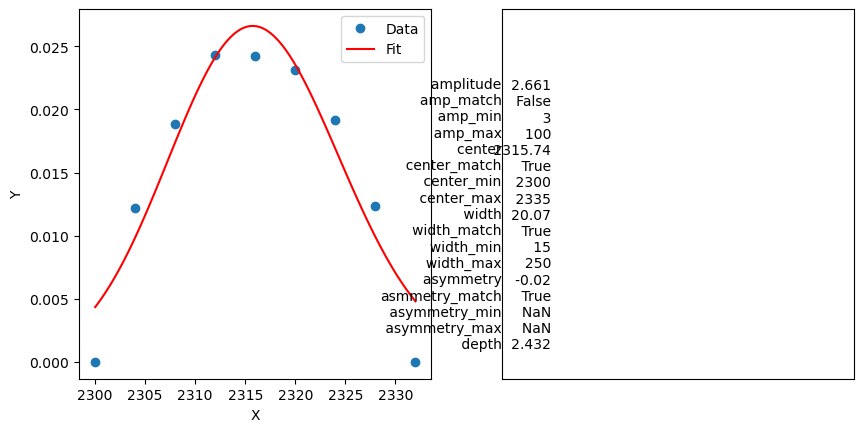

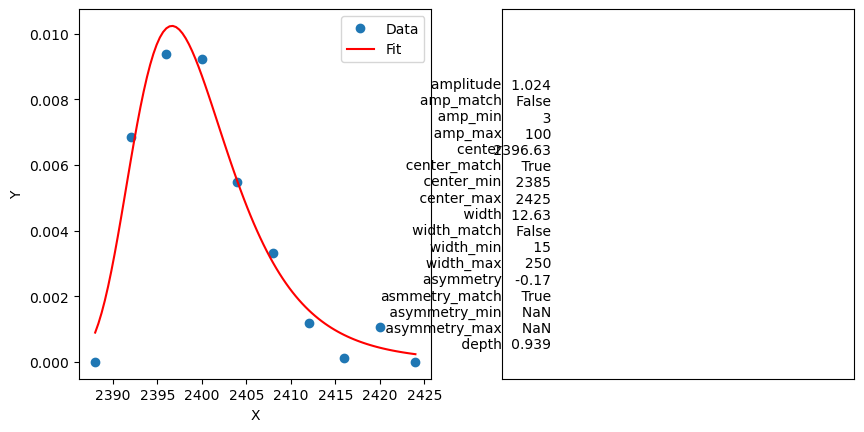

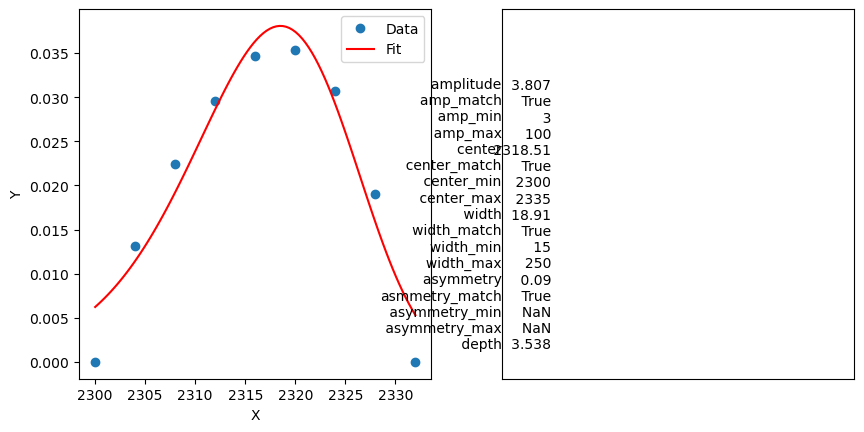

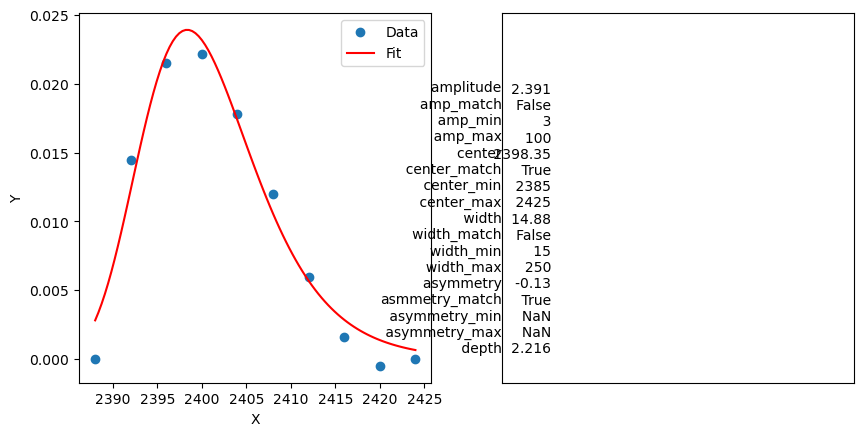

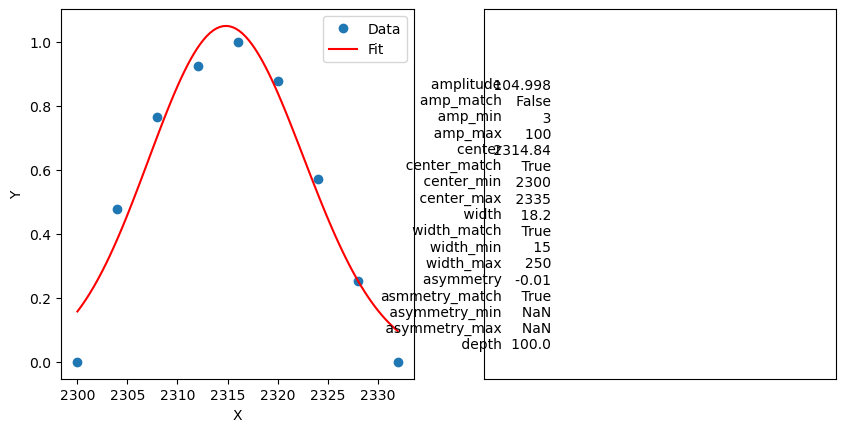

...

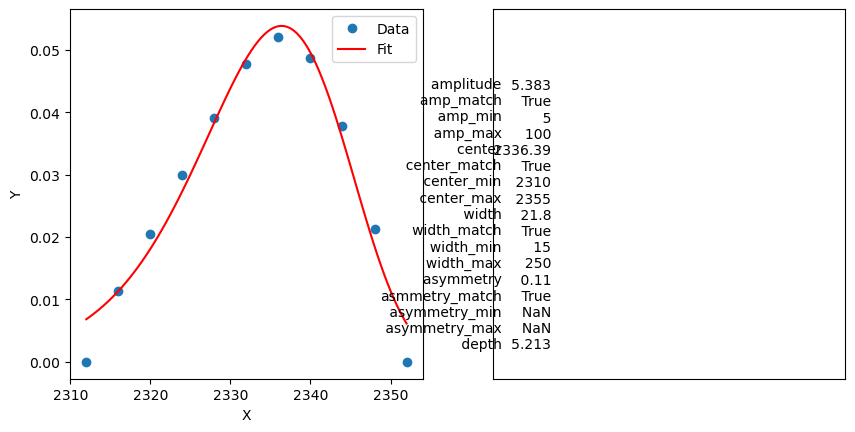

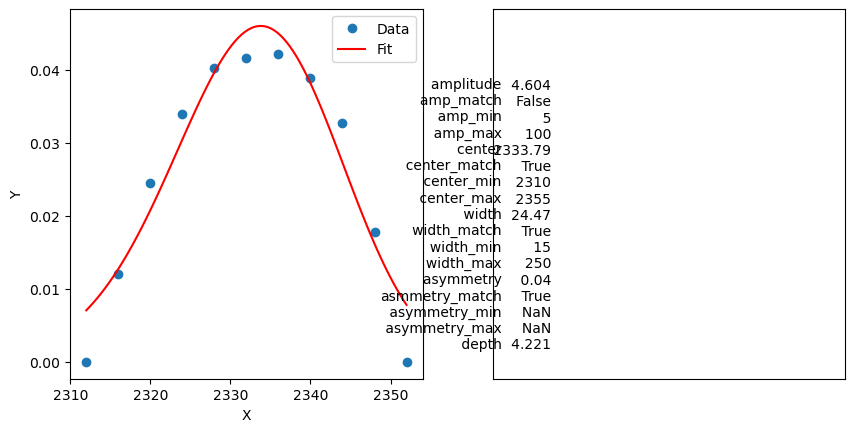

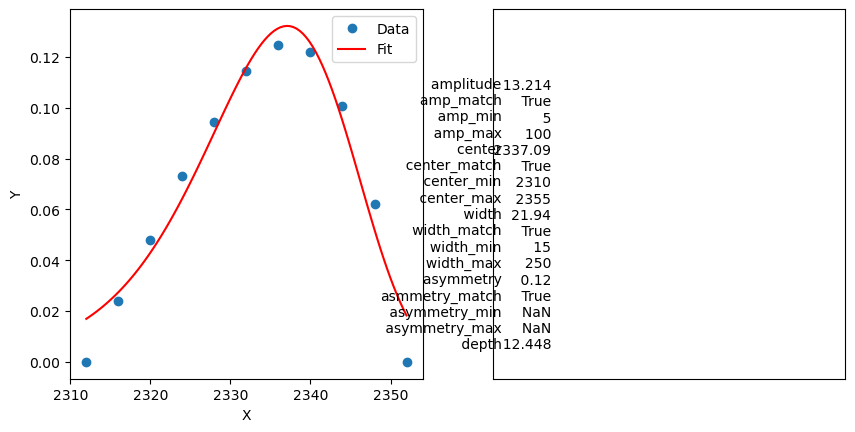

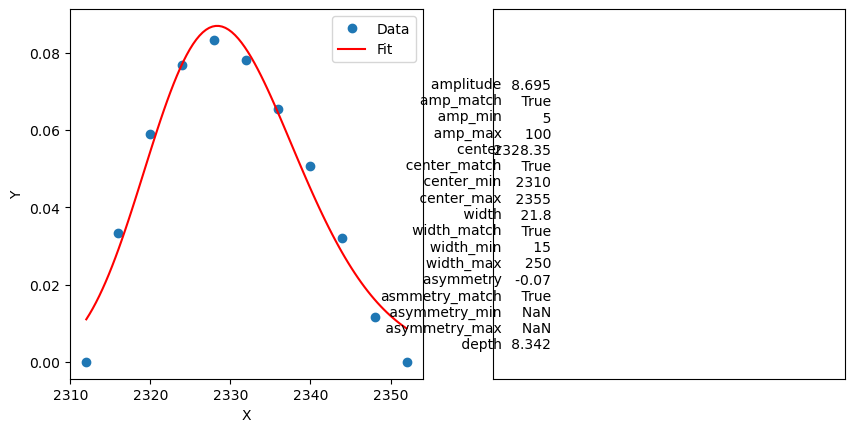

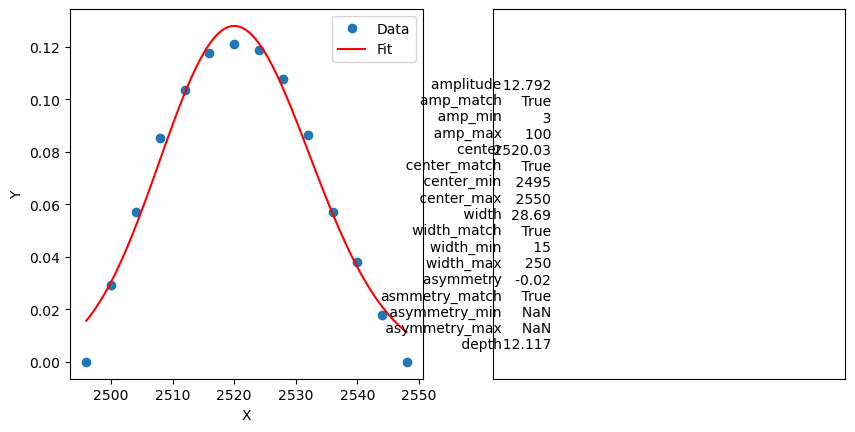

In [620]:
ref_path = 'reference_lib/'

# Enumerate all the references
csv_list = [file for file in os.listdir(ref_path) if file[-4:] == '.csv']

# Load the CSVs into a list of dataframes
csv_ref_list = [pd.read_csv(os.path.join(ref_path, csv_file)) for csv_file in csv_list]

# Set a loop that uses the reference criteria as a starting point
for curr_mineral_df in ref_lib_data[1:20]:
# curr_mineral_df = ref_lib_data[2]
    curr_mineral_name = curr_mineral_df.iloc[0,1]
    
    # Get the features for this mineral
    curr_feat_list, curr_region_list, curr_crit_list, curr_overall_list = parse_mineral_sheet(curr_mineral_df)
    
    curr_incl_features_df, curr_excl_features_df = parse_feature_list(curr_feat_list,
                                                                      curr_mineral_df)
    
    # Get a list of spectra that we're working against
    curr_ref_list = [(i, this_mineral) for i, this_mineral in enumerate(csv_list) if re.search(curr_mineral_name,
                                                                            this_mineral,
                                                                            re.IGNORECASE)]
    
    # Loop through each reference 
    for this_ref in curr_ref_list:
    # this_ref = curr_ref_list[0]
        this_ref_data = csv_ref_list[this_ref[0]]
        spectrum_x = this_ref_data.iloc[:,0].values
        spectrum_y = this_ref_data.iloc[:,1].values
        # inferred_bandwidth = spectrum_x.diff().mean()
        
        # Retrive a dict of the current features
        this_feat_dict = make_single_feature_dict(curr_incl_features_df,
                                                  spectrum_x,
                                                  spectrum_y )
        
        
        # get the data we want to fit
        for curr_ind in range(len(this_feat_dict.keys())):
            # curr_ind = 0
            if len(list(this_feat_dict.keys())) > 0:
                this_feat = list(this_feat_dict.keys())[curr_ind]
                
                curr_wavs = this_feat_dict[this_feat]['spec_subset_x']
                curr_peak = 1 - this_feat_dict[this_feat]['spec_hull_removed']
                    
                # Initial guess for the parameters
                initial_guess = [0.5, # Amplitude
                                 np.mean(curr_wavs), # Position
                                 np.std(curr_wavs), # Width
                                 0.9] # Asymmetry]
                
                # Perform the curve fit
                # Catch cases where we haven't got enough data
                if len(initial_guess) > len(curr_wavs):
                    pass
                else:
                    try:
                        params, params_covariance = curve_fit(compute_EGO_Gaussian,
                                                              curr_wavs,
                                                              curr_peak,
                                                              p0=initial_guess,
                                                              )
                    except RuntimeError as e:
                        continue
                    
                    # Extract the fitted parameters
                    # "The FWHM can be easily calculated via FWHM = 2.35482(σ )" - Pompliio 2009
                    si_fit, mu_i_fit, sigma_i_fit, k_i_fit = params
                    
                    
                    
                    # print(f"Amplitude: {np.round(params[0]*100, 2)} vs. criterion {curr_incl_features_df.iloc[curr_ind, 6]}-{curr_incl_features_df.iloc[curr_ind, 7]}")
                    # print(f"Center: {np.round(params[1], 2)}  vs. criterion {curr_incl_features_df.iloc[curr_ind, 2]}-{curr_incl_features_df.iloc[curr_ind, 3]}")
                    # print(f"Width: {np.round(params[2] * 2.35482 * inferred_bandwidth, 2)} vs. criterion {curr_incl_features_df.iloc[curr_ind, 4]}-{curr_incl_features_df.iloc[curr_ind, 5]}")
                    # print(f"Asymmetry: {np.round(params[3], 2)} vs. criterion {curr_incl_features_df.iloc[curr_ind, 8]}-{curr_incl_features_df.iloc[curr_ind, 9]}")
                    
                    
                    # Generate the x-values for plotting
                    x_values = np.linspace(min(curr_wavs), max(curr_wavs), 100)
                    
                    # Generate the y-values using the fitted parameters
                    y_values = compute_EGO_Gaussian(x_values, si_fit, mu_i_fit, sigma_i_fit, k_i_fit)
                    
                    # # Plot the original data and the fitted curve
                    # plt.scatter(curr_wavs, curr_peak, label='Data')
                    # plt.plot(x_values, y_values, 'r-', label='Fit')
                    # plt.xlabel('X')
                    # plt.ylabel('Y')
                    # plt.legend()
                    # plt.show()
                    
                    curr_name = curr_mineral_name + '_' + this_ref[1] + '_' + this_feat
                    
                    # Make a list of important values to save
                    amplitude = np.round(params[0]*100, 3)
                    amp_min = curr_incl_features_df.iloc[curr_ind, 6]
                    amp_max = curr_incl_features_df.iloc[curr_ind, 7]
                    amp_match = is_between(amplitude, amp_min, amp_max)
                    
                    center = np.round(params[1], 2)
                    center_min = curr_incl_features_df.iloc[curr_ind, 2]
                    center_max = curr_incl_features_df.iloc[curr_ind, 3]
                    center_match = is_between(center, center_min, center_max)
                    
                    width = np.round(params[2] * 2.35482, 2)
                    width_min = curr_incl_features_df.iloc[curr_ind, 4]
                    width_max = curr_incl_features_df.iloc[curr_ind, 5]
                    width_match = is_between(width, width_min, width_max)
                    
                    
                    asymmetry = np.round(params[3], 2)
                    asymmetry_min = curr_incl_features_df.iloc[curr_ind, 8]
                    asymmetry_max = curr_incl_features_df.iloc[curr_ind, 9]
                    if asymmetry_min == 'yes':
                        asmmetry_match = True
                    else:
                        asmmetry_match = is_between(asymmetry, asymmetry_min, asymmetry_max)
                    depth = np.round(curr_peak.max() * 100, 3)
                    
                    result_series = pd.Series([amplitude, amp_match, amp_min, amp_max, 
                                               center, center_match, center_min, center_max,
                                               width, width_match, width_min, width_max,
                                               asymmetry, asmmetry_match, asymmetry_min, asymmetry_max,
                                               depth], index = ['amplitude', 'amp_match', 'amp_min', 'amp_max', 
                                               'center', 'center_match', 'center_min', 'center_max',
                                               'width', 'width_match', 'width_min', 'width_max',
                                               'asymmetry', 'asmmetry_match', 'asymmetry_min', 'asymmetry_max',
                                               'depth'], name = this_ref[1] + ' ' + this_feat)
                    
                    result_df = pd.DataFrame(columns = ['amplitude', 'amp_match', 'amp_min', 'amp_max', 
                                               'center', 'center_match', 'center_min', 'center_max',
                                               'width', 'width_match', 'width_min', 'width_max',
                                               'asymmetry', 'asmmetry_match', 'asymmetry_min', 'asymmetry_max',
                                               'depth'])
                    
                    # Create the main plot
                    fig, (ax1, ax2) = plt.subplots(1, 2)
                    fig.set_figwidth(10)
                    ax1.plot(curr_wavs, curr_peak, 'o', label='Data')
                    ax1.plot(x_values, y_values, 'r-', label='Fit')
                    ax1.set_xlabel('X')
                    ax1.set_ylabel('Y')
                    ax1.legend()
                    
                    # Create a subplot for the DataFrame text
                    # ax_text = fig.add_subplot(121, frame_on=False)
                    # ax_text.axis('off')
                    df_text = pd.DataFrame(result_series.index).to_string(index = False, header = False)
                    # ax_text.text(0, 0, df_text, fontsize=10)
                    ax2.text(0.85, -0.05, df_text, transform=ax.transAxes, fontsize=10, va='bottom', ha = 'right')
                    df_text2 = pd.DataFrame(result_series).to_string(index = False, header = False)
                    ax2.text(0.95, -0.05, df_text2, transform=ax.transAxes, fontsize=10, va='bottom', ha = 'right')
                    
                    ax2.set_xticks([])
                    ax2.set_yticks([])
                    
                    # Adjust the subplot positions
                    # fig.subplots_adjust(top=0.85, bottom=0.2)
                    
                    # Save the plot as an image
                    fig.savefig(curr_name + '.pdf',
                                transparent = True)

In [529]:
params[1]

2322.4867513327067